# Inference of subgrid forcing via neural networks

Firstly, run the following. When prompted, choose a model among the list by providing its integer id (first column on the left). Note that this usually takes quite a long time to run (I don't know why but the kernel takes very long to start it seems, this is not related to the code being run).

In [4]:
import matplotlib.pyplot as plt

import numpy as np
from analysis.utils import view_predictions, DisplayMode, plot_dataset
from utils import select_run, select_experiment
from analysis.utils import play_movie
import mlflow
from mlflow.tracking import MlflowClient
import xarray as xr
time = 50

# Prompts the user to select a trained model
mlflow.set_tracking_uri('/scratch/ag7531/mlruns')
cols = ['params.model_cls_name', 'params.loss_cls_name']
exp_id, _ =select_experiment()
run = select_run(sort_by='metrics.test loss', cols=cols, experiment_ids=[exp_id,])

# Display some info about the train and validation sets for this run
print(run)

7 :  Unet
21 :  modelsv1
6 :  multiregion
3 :  multiregions
19 :  data-global
14 :  forcingdatav3
17 :  meeting22july
5 :  regionsfortraining
2 :  training
23 :  Default
4 :  default
13 :  forcingdatav2
16 :  meeting15july
22 :  parameterized
20 :  test_global
9 :  forcingdata1pct
12 :  test
15 :  datacm21
8 :  arctan
18 :  forcing-data-global
Select the id of an experiment: 21
                              run_id experiment_id params.model_cls_name  \
0   dc74cea68a7f4c7e98f9228649a97135            21              FullyCNN   
1   ec38e81123804b318c65b2c055667cbe            21                  None   
2   d5089bb089004bdf8c7de3831fc745ed            21              FullyCNN   
3   2c646c84f25b46e69fa2b323ef9eb132            21              FullyCNN   
4   7b828ab254a24c5b92557e78f601bd4f            21              FullyCNN   
5   454771c464a145dcaf75a786632976ef            21              FullyCNN   
6   4e8e899e198a4ea5b50f27555d19b97e            21              FullyCNN   
7   3d858e5

In [5]:
print(run)

run_id                                                 dc74cea68a7f4c7e98f9228649a97135
experiment_id                                                                        21
status                                                                         FINISHED
artifact_uri                          /scratch/ag7531/mlruns/21/dc74cea68a7f4c7e98f9...
start_time                                             2021-01-31 16:57:19.290000+00:00
end_time                                               2021-01-31 19:59:40.496000+00:00
metrics.test loss                                                             -1.978643
metrics.Inf Norm                                                              22.800968
metrics.R2                                                                     0.060448
metrics.train loss                                                            -1.974278
metrics.mse                                                                         NaN
params.print_every              

In [10]:
# Download model output dataset
client = MlflowClient()
run_id = run['run_id']
data_id = 0
output_file = client.download_artifacts(run_id, 
                                        f'model_output/test_output{data_id}')
model_output = xr.open_zarr(output_file)

In [11]:
model_output

<xarray.Dataset>
Dimensions:    (latitude: 38, longitude: 45, time: 1096)
Coordinates:
  * latitude   (latitude) float64 37.22 37.54 37.85 38.17 ... 47.52 47.79 48.06
  * longitude  (longitude) float64 -43.75 -43.35 -42.95 ... -26.95 -26.55 -26.15
  * time       (time) object 0198-01-01 12:00:00 ... 0200-12-31 12:00:00
Data variables:
    S_x        (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_xpred    (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_xscale   (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_y        (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_ypred    (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_yscale   (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    u_surf     (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    v_surf     (time, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>

In [7]:
raw_data = client.download_artifacts(run['params.run_id'].split('/')[0], 'forcing')
raw_data = xr.open_zarr(raw_data)
raw_datasets = load_training_datasets(raw_data, 'training_subdomains.yaml')

/home/ag7531/code/subgrid/data/utils.py:30: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  subdomains = yaml.load(f)


In [8]:
raw_datasets

[<xarray.Dataset>
 Dimensions:   (time: 7305, xu_ocean: 75, yu_ocean: 51)
 Coordinates:
   * time      (time) object 0181-01-01 12:00:00 ... 0200-12-31 12:00:00
   * xu_ocean  (xu_ocean) float64 -49.75 -49.35 -48.95 ... -20.95 -20.55 -20.15
   * yu_ocean  (yu_ocean) float64 35.28 35.61 35.93 36.26 ... 49.38 49.64 49.9
 Data variables:
     S_x       (time, yu_ocean, xu_ocean) float32 dask.array<chunksize=(1, 51, 75), meta=np.ndarray>
     S_y       (time, yu_ocean, xu_ocean) float32 dask.array<chunksize=(1, 51, 75), meta=np.ndarray>
     usurf     (time, yu_ocean, xu_ocean) float32 dask.array<chunksize=(1, 51, 75), meta=np.ndarray>
     vsurf     (time, yu_ocean, xu_ocean) float32 dask.array<chunksize=(1, 51, 75), meta=np.ndarray>,
 <xarray.Dataset>
 Dimensions:   (time: 7305, xu_ocean: 45, yu_ocean: 45)
 Coordinates:
   * time      (time) object 0181-01-01 12:00:00 ... 0200-12-31 12:00:00
   * xu_ocean  (xu_ocean) float64 -179.7 -179.3 -178.9 ... -162.9 -162.5 -162.1
   * yu_ocean  (y

In [16]:
data = raw_datasets[0]
data['time_index'] = xr.DataArray(np.arange(len(data.coords['time'])),
                                       dims = ('time',),
                                       coords = {'time' : data['time']})
data = data.swap_dims({'time' : 'time_index'})

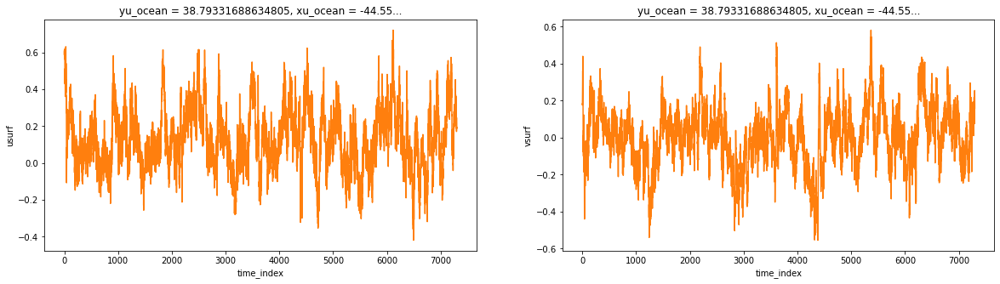

In [17]:
from random import randint
plot_dataset(data[['usurf', 'vsurf']].isel(xu_ocean=randint(0, len(data['xu_ocean'])),
                                           yu_ocean=randint(0, len(data['yu_ocean']))))

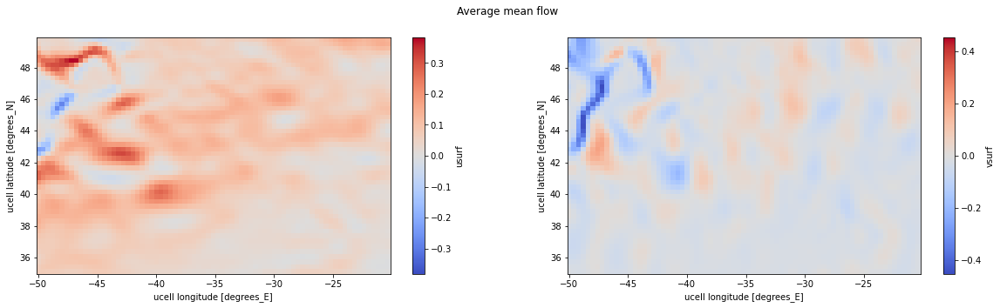

In [53]:
plot_dataset(data[['usurf', 'vsurf']].mean(dim='time_index'))
_ = plt.suptitle('Average mean flow')

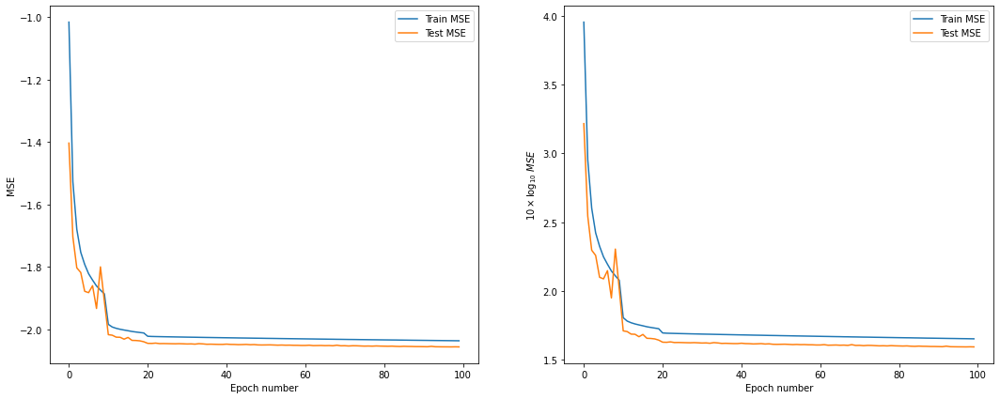

In [18]:
train_mse = client.get_metric_history(run_id, 'train loss')
test_mse = client.get_metric_history(run_id, 'test loss')
train_mse = np.array([el.value for el in train_mse])
test_mse = np.array([el.value for el in test_mse])
plt.figure(figsize = (18, 7))
plt.subplot(1, 2, 1)
plt.plot(train_mse)
plt.plot(test_mse)
plt.xlabel('Epoch number')
plt.ylabel('MSE')
plt.legend(('Train MSE', 'Test MSE'))
plt.subplot(1, 2, 2)
plt.plot(10*np.log10(train_mse + 3.5))
plt.plot(10*np.log10(test_mse + 3.5))
plt.xlabel('Epoch number')
plt.ylabel(r'$10 \times \log_{10} \ MSE$')
plt.legend(('Train MSE', 'Test MSE'))

The train loss and the test loss initially decrease steeply with the number of epochs (each epoch has around 600 samples and our number of parameters is not that high as we only use convolutional layers plus a final locally connected layer). 

The validation data for this dataset is available in the form of a dataset. Run the following to add a time index and print the model_output dataset. The variables u_surf and v_surf are the surface velocity components that are used as input. 

In [19]:
model_output['time_index'] = xr.DataArray(np.arange(len(model_output.coords['time'])),
                                       dims = ('time',),
                                       coords = {'time' : model_output['time']})
model_output = model_output.swap_dims({'time' : 'time_index'})
model_output

<xarray.Dataset>
Dimensions:     (latitude: 38, longitude: 45, time_index: 1095)
Coordinates:
  * latitude    (latitude) float64 -38.87 -38.56 -38.25 ... -27.17 -26.81 -26.46
  * longitude   (longitude) float64 -179.7 -179.3 -178.9 ... -162.5 -162.1
    time        (time_index) object 0197-12-28 12:00:00 ... 0200-12-26 12:00:00
  * time_index  (time_index) int64 0 1 2 3 4 5 ... 1089 1090 1091 1092 1093 1094
Data variables:
    S_x         (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_xpred     (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_xscale    (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_y         (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_ypred     (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    S_yscale    (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    u_surf      (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>
    v_surf      (time_index, latitude, longitude) float64 dask.array<chunksize=(274, 10, 23), meta=np.ndarray>

We create a dataset of the errors

In [44]:
test_ds=xr.Dataset(dict(a=xr.DataArray([1,2,3], dims=('x',))), coords=dict(x=[5, 12, 13]))

In [45]:
xr.DataArray([1,2,3], coords=dict(x=[1,2,5]), dims=test_ds.dims)

<xarray.DataArray (x: 3)>
array([1, 2, 3])
Coordinates:
  * x        (x) int64 1 2 5

In [23]:
model_output['S_xscale'] = 1 / (model_output['S_xscale'])
model_output['S_yscale'] = 1 / (model_output['S_yscale'])
errors_x = model_output['S_xpred'] - model_output['S_x']
errors_y = model_output['S_ypred'] - model_output['S_y']
errors_x_n = errors_x / model_output['S_xscale']
errors_y_n = errors_y / model_output['S_yscale']
mse_x = (errors_x**2).mean(dim='time_index')
mse_y = (errors_y**2).mean(dim='time_index')
mse_time = ((errors_x + errors_y)**2).mean(dim='latitude').mean(dim='longitude')
mse_time_n = ((errors_x_n + errors_y_n)**2).mean(dim='latitude').mean(dim='longitude')
errors_ds = xr.Dataset({'S_x (error)' : errors_x, 'S_y (error)' : errors_y, 
                        'S_x (mse)' : mse_x, 'S_y (mse)' : mse_y,
                        'S_x (normalised error)' : errors_x_n,
                        'S_y (normalised error)' : errors_y_n,
                        'mse (time)' : mse_time,
                         'mse (time, normalized)': mse_time_n})


/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


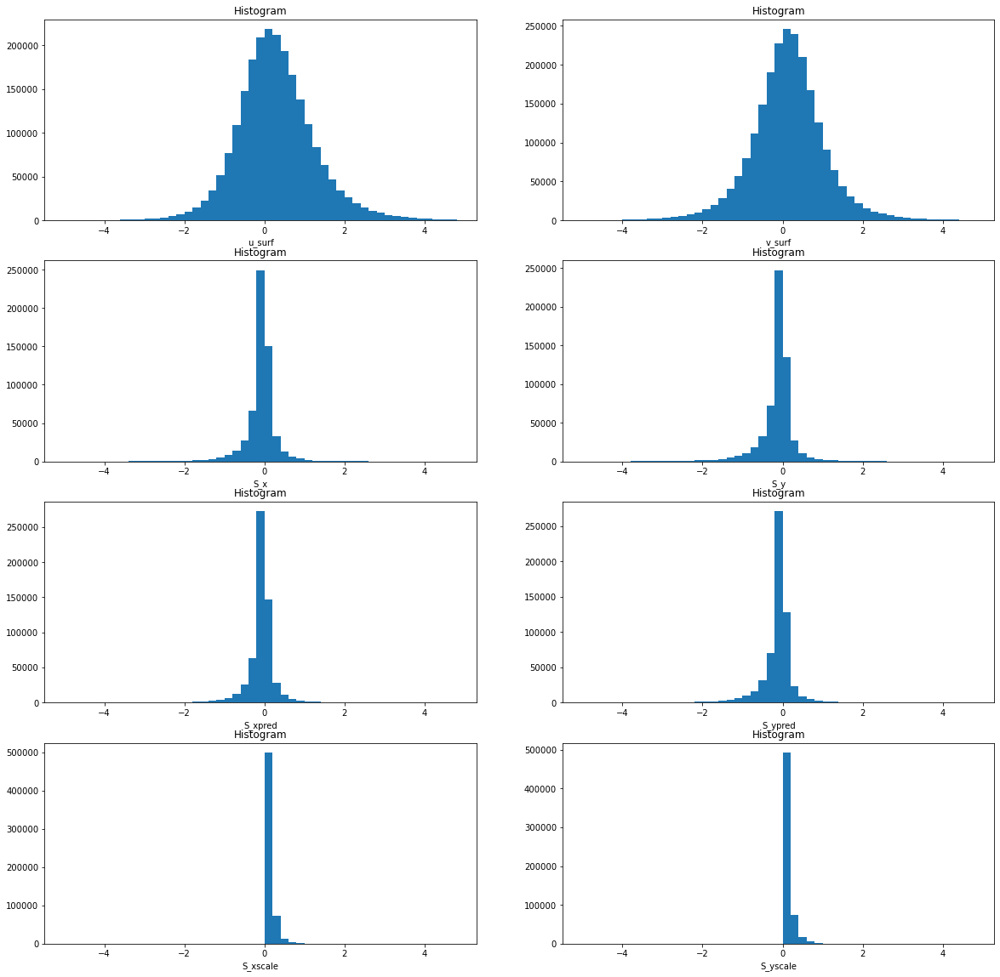

In [24]:
plot_dataset(model_output[['u_surf', 'v_surf', 'S_x', 'S_y', 'S_xpred', 'S_ypred', 'S_xscale', 'S_yscale']], plot_type='hist', bins=np.arange(-5,5, 0.2))

In [25]:
(abs(model_output)).max().compute()

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/dask/utils.py:31: RuntimeWarning: All-NaN slice encountered
  return func(*args, **kwargs)


<xarray.Dataset>
Dimensions:   ()
Data variables:
    S_x       float64 12.79
    S_xpred   float64 11.43
    S_xscale  float64 2.155
    S_y       float64 9.611
    S_ypred   float64 10.43
    S_yscale  float64 2.181
    u_surf    float64 7.645
    v_surf    float64 7.443

We plot a snapshot corresponding to a random day from our test data. The first row correspond to the two components of the surface velocity field. The second row correspond to the two components of the "true" forcing. The third row corresponds to the two components of the predicted subgrid forcing.

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


359


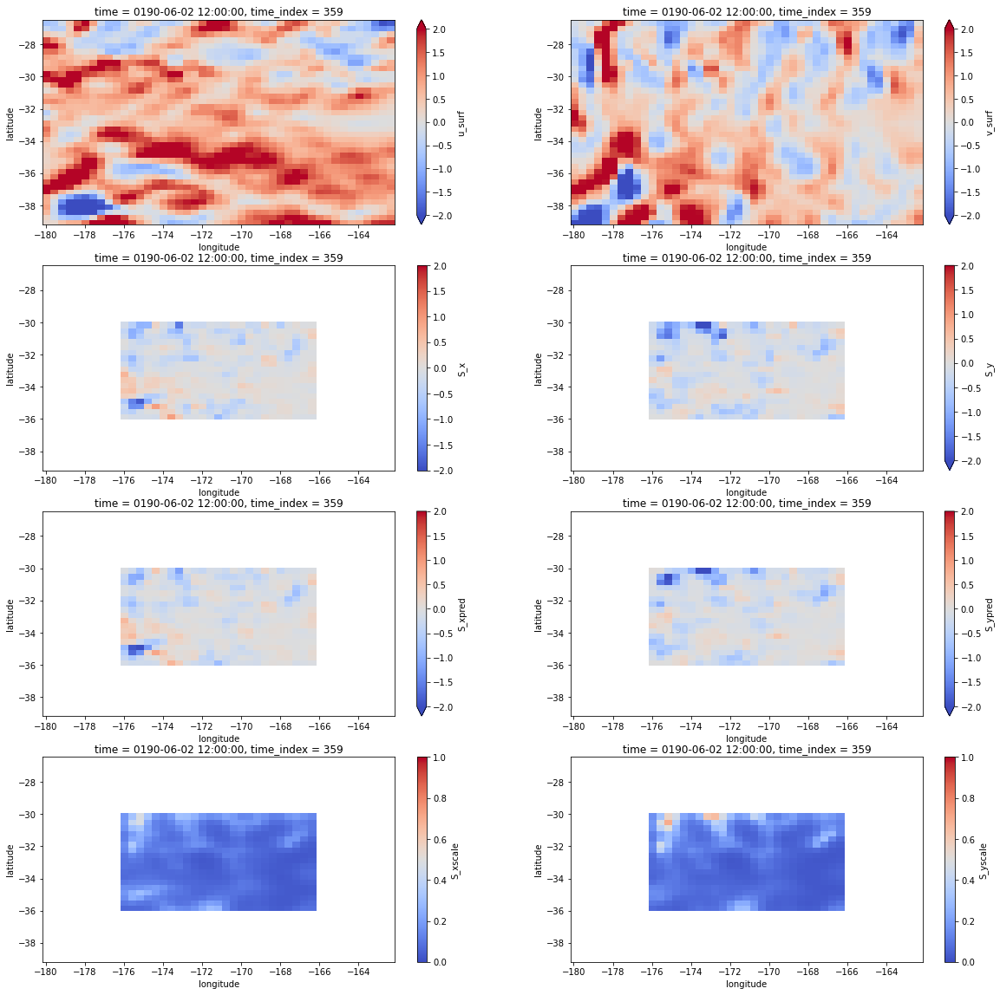

In [32]:
from random import randint
n_times = len(model_output['time'])
random_time = randint(340, 500)
#random_time=301
plot_dataset(model_output.isel(time_index=random_time)[['u_surf', 'v_surf', 'S_x', 'S_y', 'S_xpred', 'S_ypred', 
                                                         'S_xscale', 'S_yscale']],
            vmin = [-2]*6 + [-0.0, 0.0], vmax = [2]*6+[1, 1])
print(random_time)


## Distribution of true vs pred 

In [5]:
model_output['rez'] = (model_output['S_xpred'] - model_output['S_x']) / model_output['S_xscale']

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [6]:
from dask.diagnostics import ProgressBar
def func(x):
    return np.power(x, 3) / 100
def func2(x):
    return x
with ProgressBar():
    groups = model_output.groupby_bins('S_xpred', func(np.arange(-10, 10.1, 0.25)))
groups

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[########################################] | 100% Completed |  0.8s


DatasetGroupBy, grouped over 'S_xpred_bins' 
73 groups with labels (-0.0338,, -0.0195], ..., (-10....

In [7]:
with ProgressBar():
    m = groups.apply(lambda x: x.mean(skipna=True)).compute()
    s = groups.apply(lambda x: x.std(skipna=True)).compute()
    sup = groups.apply(lambda x: x.max(skipna=True)).compute()

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[########################################] | 100% Completed | 16.8s
[########################################] | 100% Completed | 16.5s
[########################################] | 100% Completed | 12.2s


/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


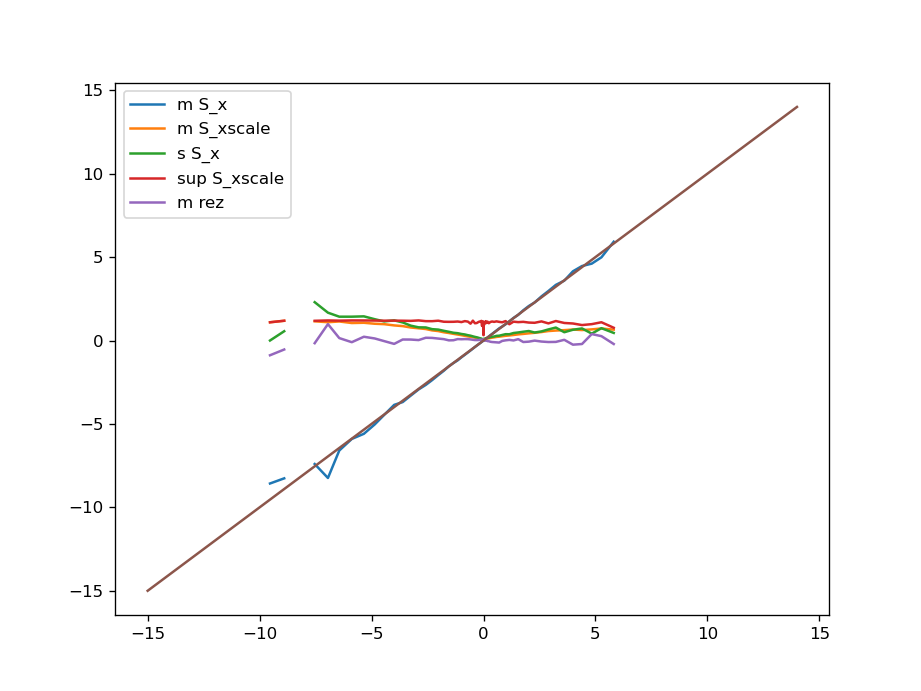

In [8]:
%matplotlib notebook
plt.figure()
plt.plot(m['S_xpred'], m['S_x'])
plt.plot(m['S_xpred'], m['S_xscale'])
plt.plot(m['S_xpred'], s['S_x'])
plt.plot(m['S_xpred'], sup['S_xscale'])
plt.plot(m['S_xpred'], m['rez'])
plt.plot(np.arange(-15, 15), np.arange(-15, 15))
plt.legend(('m S_x', 'm S_xscale', 's S_x', 'sup S_xscale', 'm rez'))

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<IPython.core.display.Javascript object>


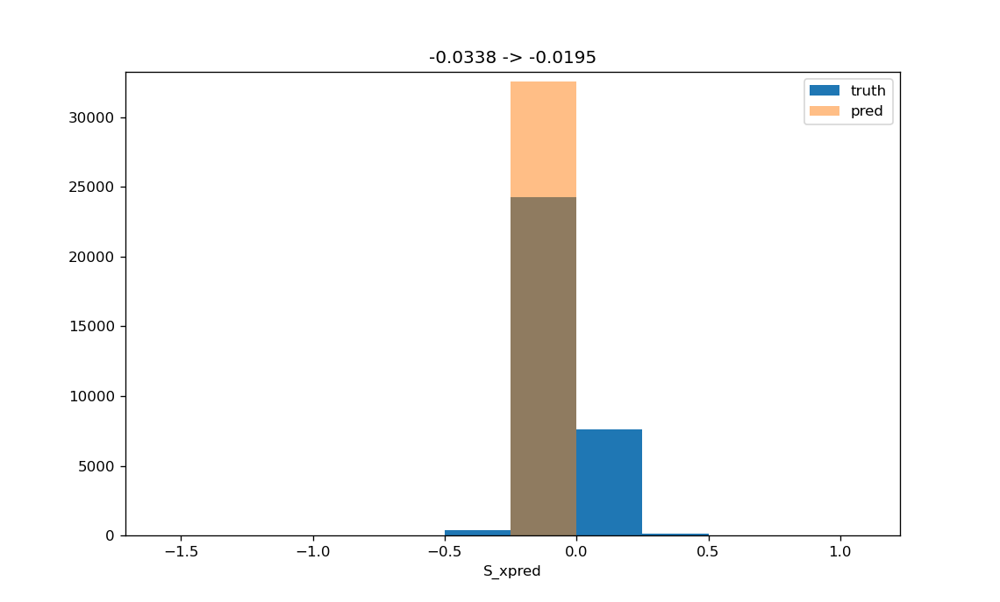

[########################################] | 100% Completed |  0.1s
[########################################] | 100% Completed |  0.1s


In [22]:
from random import randint
plt.figure()
with ProgressBar():
    for i, g in enumerate(groups):
        if g[0].left < -4:
            continue
        g[1]['S_x'].plot.hist(bins=np.arange(-20, 20, 0.25))
        g[1]['S_xpred'].plot.hist(bins=np.arange(-20, 20, 0.25), alpha=0.5)
        plt.legend(('truth', 'pred'))
        plt.title(str(g[0].left) + ' -> ' + str(g[0].right))
        break

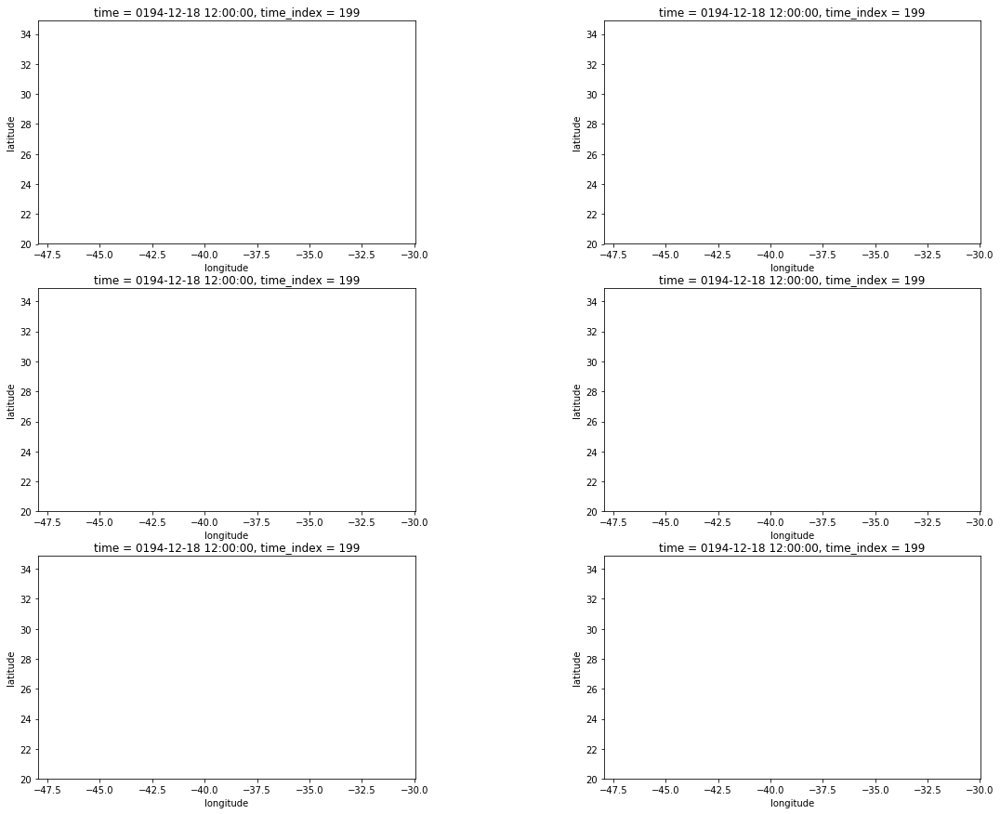

In [32]:
ani = dataset_to_movie(model_output.isel(time_index=slice(0, 200))[['u_surf', 'v_surf', 'S_x', 'S_xpred', 'S_y', 'S_ypred']],
                      interval = 200)

In [33]:
video = ani.to_html5_video()

In [34]:
from IPython.display import HTML
HTML(video)

We do a quick analysis by showing the MSE across time at all spatial points of our domain. We also plot the mean ampltiude of the velocity components as well as its variance.

/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


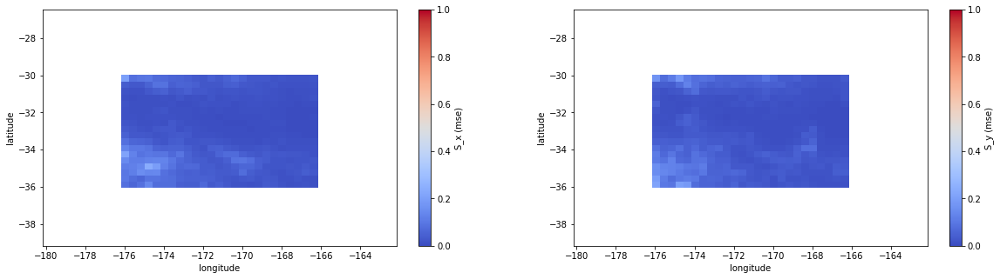

In [33]:
plot_dataset(errors_ds[['S_x (mse)', 'S_y (mse)']], vmin=0, vmax=1)

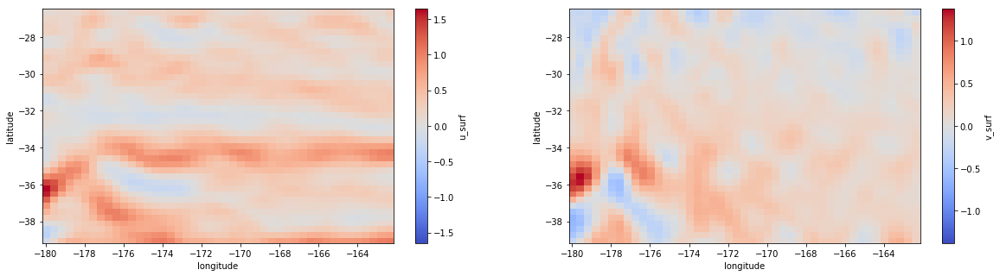

In [34]:
plot_dataset(model_output[['u_surf', 'v_surf']].mean(dim='time_index'))

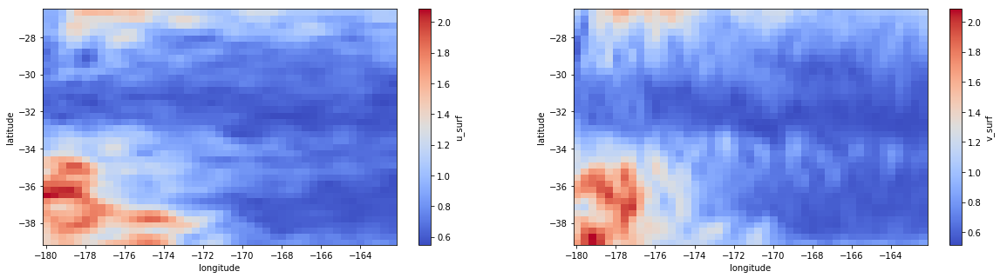

In [35]:
plot_dataset(model_output[['u_surf', 'v_surf']].std(dim='time_index'))

It doesn't seem far fetched to associate the larger errors in the predicted subgrid forcing with the larger variance of the velocity field, at least for the NW area.
We could look at the time series of the predictions for the specific areas with larger errors.

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


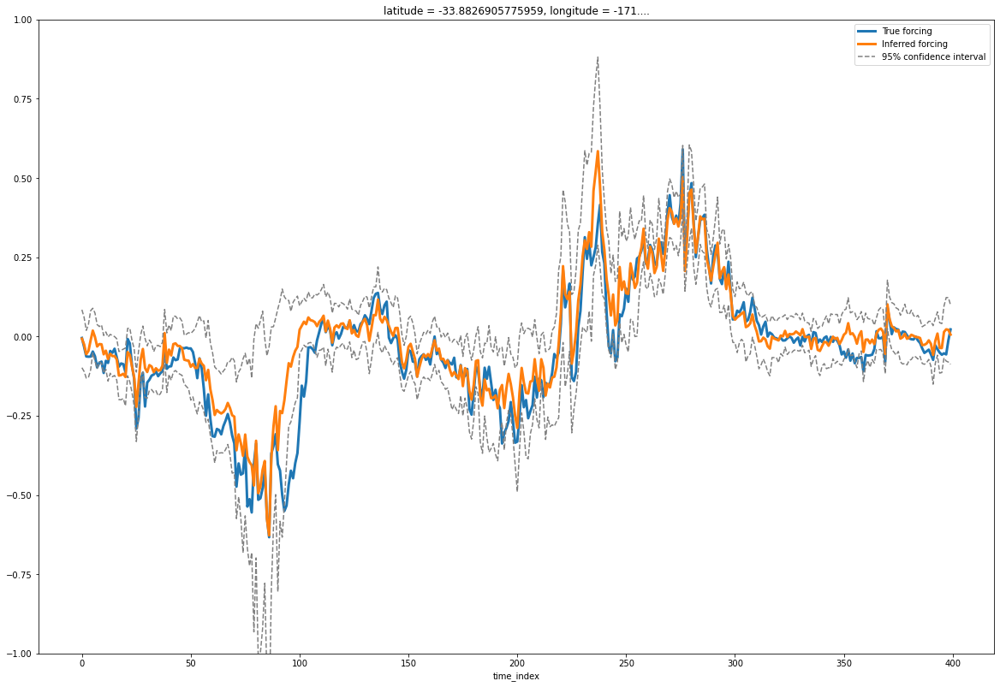

In [33]:
fig = plt.figure(figsize=(20, 30))
long = -172
lat = -34

plt.subplot(2, 1, 1)
time = slice(0, 400)
model_output['S_y'].isel(time_index=time).sel(longitude=long, latitude=lat, method='nearest').plot(linewidth=3)
model_output['S_ypred'].isel(time_index=time).sel(longitude=long, latitude=lat, method='nearest').plot(linewidth=3)
uB = model_output['S_ypred'] + 1.96 * model_output['S_yscale']
lB = model_output['S_ypred'] - 1.96 * model_output['S_yscale']
uB.isel(time_index=time).sel(longitude=long, latitude=lat, method='nearest').plot(linestyle='--',color='gray')
lB.isel(time_index=time).sel(longitude=long, latitude=lat, method='nearest').plot(linestyle='--',color='gray')
plt.ylim(-1, 1)
plt.legend(('True forcing', 'Inferred forcing', '95% confidence interval'))

We see that the amplitude of the forcing reaches 15 stds at some point. This needs investigation. It also turns out that the same phenomenon is observed for the NW location where larger errors are seen.

We also look at the aspect of the error through time.

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


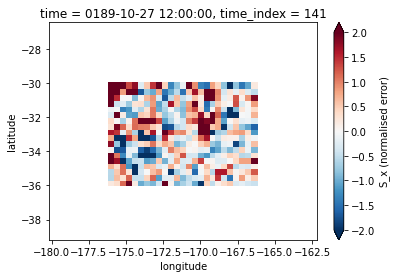

In [34]:
(errors_ds['S_x (normalised error)']).isel(time_index=randint(0, 500)).plot(vmax=2)

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


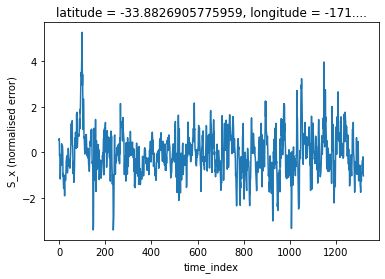

In [35]:
errors_ds['S_x (normalised error)'].sel(longitude=-172, latitude=-34, method='nearest').plot()

/home/ag7531/miniconda3/envs/analysis/lib/python3.7/site-packages/ipykernel/ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


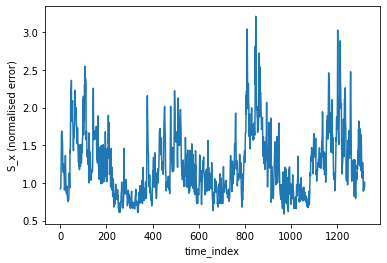

In [36]:
((errors_ds['S_x (normalised error)'])**2).mean(dim=('longitude', 'latitude')).plot()

Again we look at the amplitude of the velocity field along the same dimension (time this time)

/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/home/ag7531/miniconda3/envs/mlflow-2428cb47d93b4486f90b5f8bb1835e697d4a2328/lib/python3.7/site-packages/dask/array/numpy_compat.py:40: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


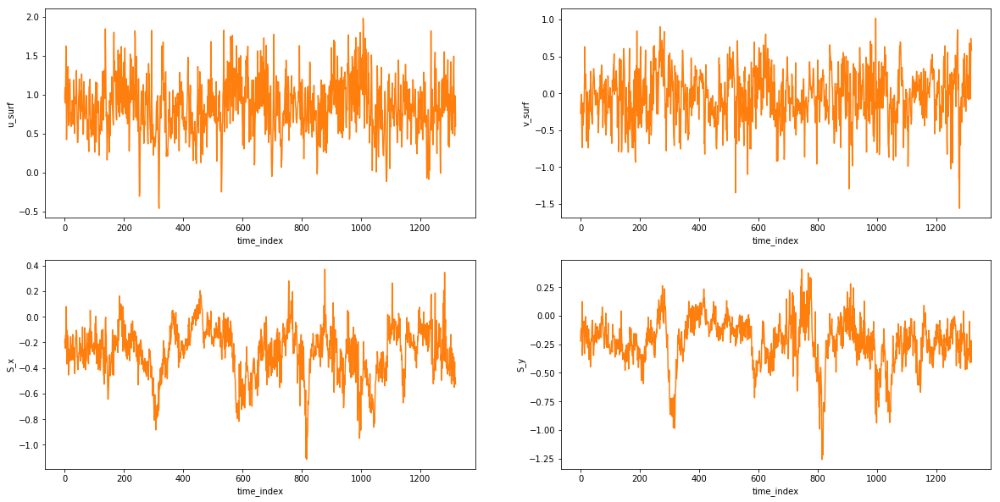

In [23]:
plot_dataset(model_output[['u_surf', 'v_surf', 'S_x', 'S_y']].mean(dim='latitude').mean(dim='longitude'))

(-7, 7)

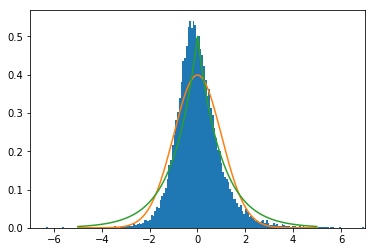

In [44]:
from analysis.utils import sample
from scipy.stats import norm
from scipy.stats import laplace
from scipy.stats import t
t0 = t(6)
errors_ds = errors_ds.sel(longitude=slice(-175, -167), latitude=slice(-36, -30))
residuals = errors_ds[['S_x (normalised error)', 'S_y (normalised error)']].to_array().compute().data
residuals = residuals.swapaxes(0, 1)
s0 = sample(residuals, 5, 50)
s1 = s0 / np.std(s0)
plt.hist(s1[:, :, :].reshape((-1, 1)), bins = 500, density=True)
plt.plot(np.arange(-5, 5, 0.01), norm.pdf(np.arange(-5, 5, 0.01)))
plt.plot(np.arange(-5, 5, 0.01), laplace.pdf(np.arange(-5, 5, 0.01)))
# plt.plot(np.arange(-5, 5, 0.01), t0.pdf(np.arange(-5, 5, 0.01)))


plt.xlim([-7, 7])

In [45]:
np.mean(residuals)

0.026914897987428098

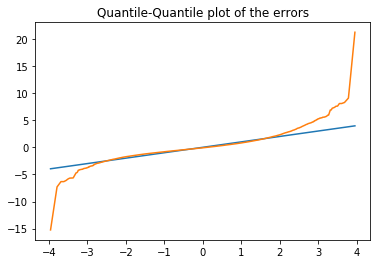

In [46]:
from scipy.stats import norm
t0 = t(6)
errors = s1[:, :, :].reshape(-1, 1)
errors = errors - np.mean(errors)
n = errors.shape[0]
norm_quantiles = norm.ppf(np.linspace(1/n, 1 - 1/n, n))
sorted_errors = np.sort(errors, axis=None)
plt.plot(norm_quantiles, norm_quantiles)
plt.plot(norm_quantiles, sorted_errors)
_ = plt.title('Quantile-Quantile plot of the errors')